# Stainlib: Usage example of normalizing with a target image

In [1]:
import stainlib
import requests
import numpy as np
import matplotlib.pyplot as plt
from skimage.transform import resize
from PIL import Image
from io import BytesIO
from stainlib.utils.plot_utils import _plot_imagegrid
from stainlib.normalization.normalizer import ExtractiveStainNormalizer, ReinhardStainNormalizer
from stainlib.utils.stain_utils import is_uint8_image


In [2]:
target_images_urls = []
target_images_urls.append('https://upload.wikimedia.org/wikipedia/commons/3/3c/Histopathology_of_Echinococcus_granulosus_hydatid_cyst_in_a_sheep_09G0016_lores.jpg?uselang=fr')
target_images_urls.append('https://upload.wikimedia.org/wikipedia/commons/b/bc/Breast_carcinoma_in_a_lymph_node.jpg')
target_images_urls.append('https://upload.wikimedia.org/wikipedia/commons/b/b2/Tubular_adenoma_2_intermed_mag.jpg')
target_images_urls.append('https://upload.wikimedia.org/wikipedia/commons/7/7f/Breast_DCIS_Solid_IntermediateGrade_SNP.jpg')
target_images_urls.append('https://upload.wikimedia.org/wikipedia/commons/d/d3/Colorectal_adenocarcinoma_-_alt_--_high_mag.jpg')

source_images_urls = []
source_images_urls.append('https://upload.wikimedia.org/wikipedia/commons/c/c7/Cecal_adenocarcinoma.jpg')
source_images_urls.append('https://upload.wikimedia.org/wikipedia/commons/1/1b/Prostate_carcinoma_with_blue_mucin_--_high_mag.jpg')
source_images_urls.append('https://upload.wikimedia.org/wikipedia/commons/2/20/Colorectal_adenocarcinoma_--_low_mag.jpg')
source_images_urls.append('https://upload.wikimedia.org/wikipedia/commons/1/1a/Villous_adenoma1.jpg')
source_images_urls.append('https://upload.wikimedia.org/wikipedia/commons/d/d2/Crc_met_to_node1.jpg')


In [3]:
target_width = 224
target_images = []
source_images = []
titles = []
titles.append("Target Images")
for i in range(len(target_images_urls)):
    response = requests.get(target_images_urls[i])
    patch_target = np.array(Image.open(BytesIO(response.content)))
    wpercent = (target_width/float(patch_target.shape[0]))
    hsize = int((float(patch_target.shape[1])*float(wpercent)))
    rescaled_target = resize(patch_target, [target_width, hsize])[:,0:224,:]
    target_images.append(np.clip(rescaled_target*255,0,255).astype(np.uint8))
    
    response = requests.get(source_images_urls[i])
    patch_source = np.array(Image.open(BytesIO(response.content)))
    wpercent = (target_width/float(patch_source.shape[0]))
    hsize = int((float(patch_source.shape[1])*float(wpercent)))
    titles.append(None)
    rescaled_source = resize(patch_source, [target_width, hsize])[:,0:224,:]
    source_images.append(np.clip(rescaled_source*255,0,255).astype(np.uint8))

/Users/sebastianotalora/work/deliverable3_3_color/stainlib/utils/plot_utils.py:25: MatplotlibDeprecationWarning: Passing the minor parameter of set_ticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  ax.set_yticks([], [])
/Users/sebastianotalora/work/deliverable3_3_color/stainlib/utils/plot_utils.py:33: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


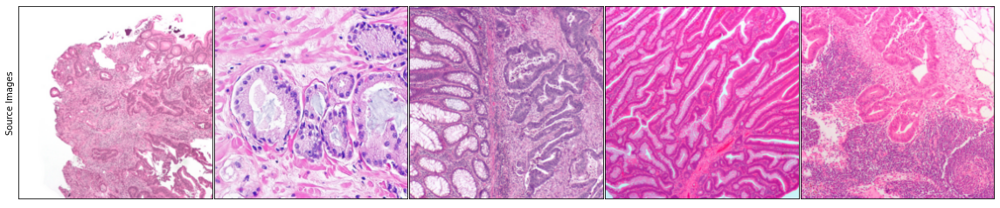

In [4]:
_plot_imagegrid(source_images, (1,len(source_images)),figsize=(20,10), ylabels=["Source Images"] + [None]*5)

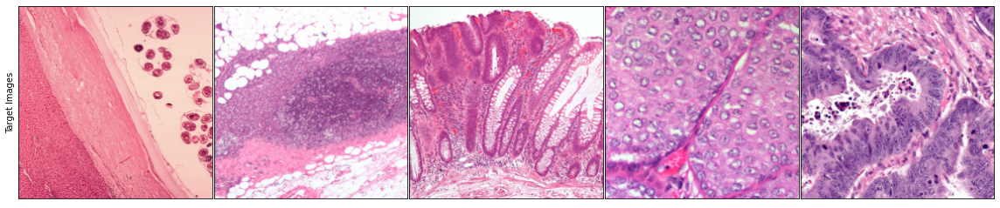

In [5]:
_plot_imagegrid(target_images, (1,len(target_images)),figsize=(20,10), ylabels=["Target Images"] + [None]*5)

## Vahadane normalization

In [6]:
all_transformed = []
normalizer = stainlib.normalization.normalizer.ExtractiveStainNormalizer(method='vahadane')
for j in range(5):
    row_transformed = []
    # Standardize brightness (This step is optional but can improve the tissue mask calculation)
    target = stainlib.utils.stain_utils.LuminosityStandardizer.standardize(target_images[j])
    row_transformed.append(target)
    normalizer.fit(target)
    for i in range(5):
        to_transform = stainlib.utils.stain_utils.LuminosityStandardizer.standardize(source_images[i])
        transformed = normalizer.transform(to_transform)
        row_transformed.append(transformed)
    all_transformed.append(row_transformed)

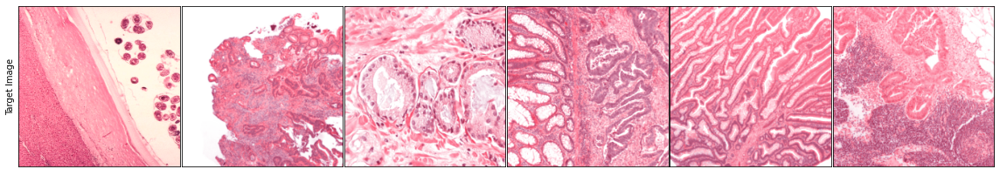

In [7]:
_plot_imagegrid(all_transformed[0], (1,len(row_transformed)),figsize=(20,20), ylabels=["Target Image"] + [None]*5)

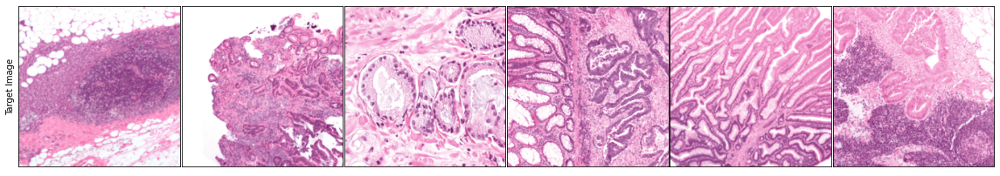

In [8]:
_plot_imagegrid(all_transformed[1], (1,len(row_transformed)),figsize=(20,20), ylabels=["Target Image"] + [None]*5)

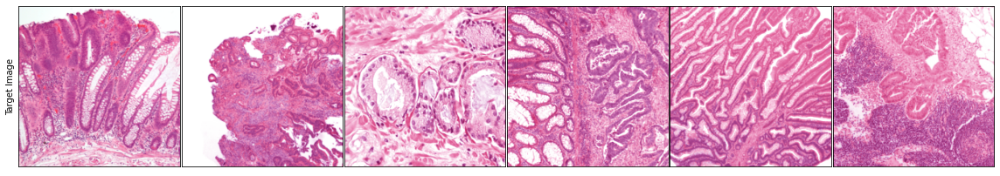

In [9]:
_plot_imagegrid(all_transformed[2], (1,len(row_transformed)),figsize=(20,20), ylabels=["Target Image"] + [None]*5)

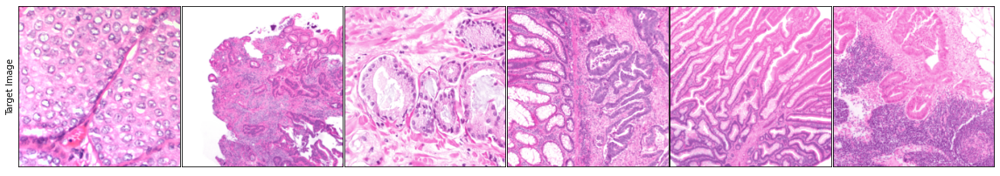

In [10]:
_plot_imagegrid(all_transformed[3], (1,len(row_transformed)),figsize=(20,20), ylabels=["Target Image"] + [None]*5)

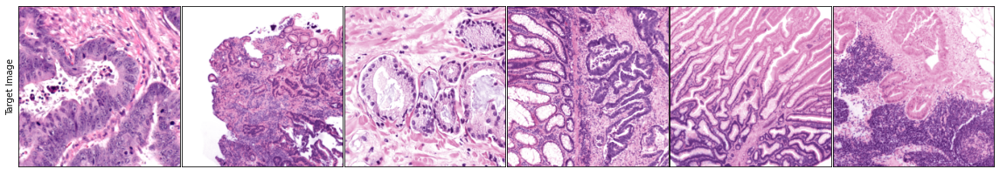

In [11]:
_plot_imagegrid(all_transformed[4], (1,len(row_transformed)),figsize=(20,20), ylabels=["Target Image"] + [None]*5)

## Macenko normalization

In [12]:
all_transformed = []
normalizer = stainlib.normalization.normalizer.ExtractiveStainNormalizer(method='macenko')
for j in range(5):
    row_transformed = []
    # Standardize brightness (This step is optional but can improve the tissue mask calculation)
    target = stainlib.utils.stain_utils.LuminosityStandardizer.standardize(target_images[j])
    row_transformed.append(target)
    for i in range(5):
        to_transform = stainlib.utils.stain_utils.LuminosityStandardizer.standardize(source_images[i])
        normalizer.fit(target)
        transformed = normalizer.transform(to_transform)
        row_transformed.append(transformed)
    all_transformed.append(row_transformed)

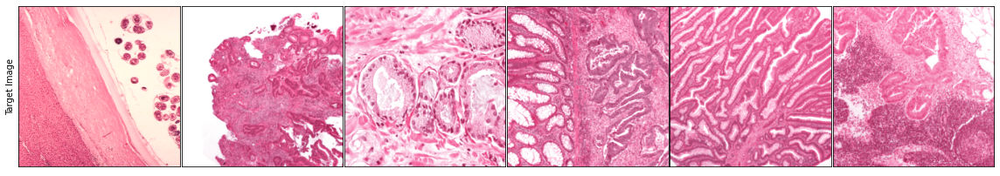

In [13]:
_plot_imagegrid(all_transformed[0], (1,len(row_transformed)),figsize=(20,20), ylabels=["Target Image"] + [None]*5)

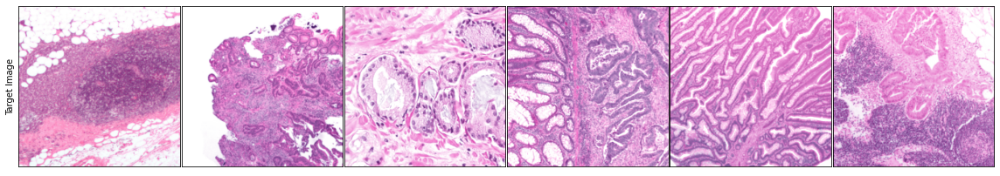

In [14]:
_plot_imagegrid(all_transformed[1], (1,len(row_transformed)),figsize=(20,20), ylabels=["Target Image"] + [None]*5)

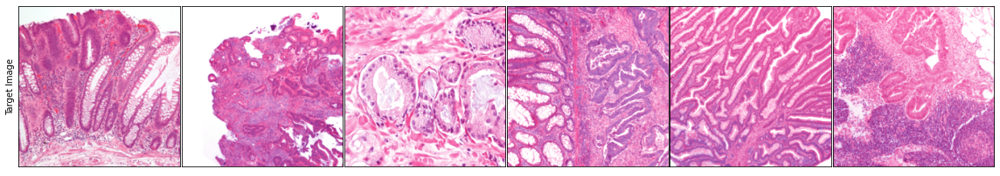

In [15]:
_plot_imagegrid(all_transformed[2], (1,len(row_transformed)),figsize=(20,20), ylabels=["Target Image"] + [None]*5)

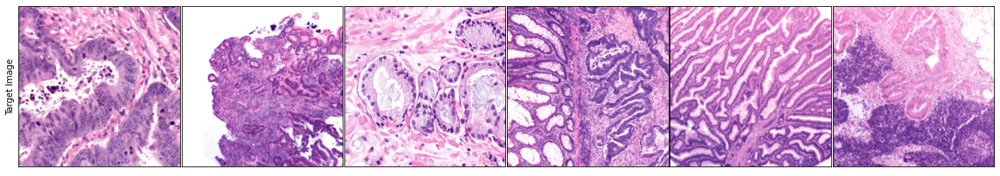

In [16]:
_plot_imagegrid(all_transformed[4], (1,len(row_transformed)),figsize=(20,20), ylabels=["Target Image"] + [None]*5)

## Reinhard normalization

In [17]:
all_transformed = []
normalizer = ReinhardStainNormalizer()
for j in range(5):
    row_transformed = []
    # Standardize brightness (This step is optional but can improve the tissue mask calculation)
    target = stainlib.utils.stain_utils.LuminosityStandardizer.standardize(target_images[j])
    row_transformed.append(target)
    for i in range(5):
        to_transform = stainlib.utils.stain_utils.LuminosityStandardizer.standardize(source_images[i])
        normalizer.fit(target)
        transformed = normalizer.transform(to_transform,mask_background=False)
        row_transformed.append(transformed)
    all_transformed.append(row_transformed)

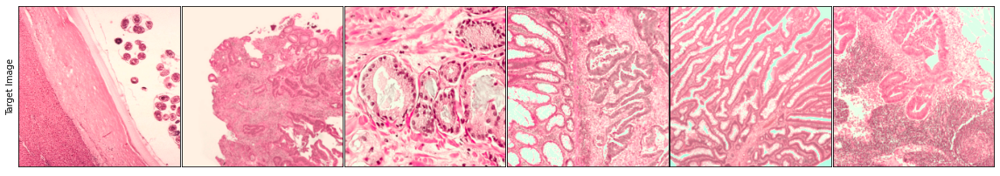

In [18]:
_plot_imagegrid(all_transformed[0], (1,len(row_transformed)),figsize=(20,20), ylabels=["Target Image"] + [None]*5)

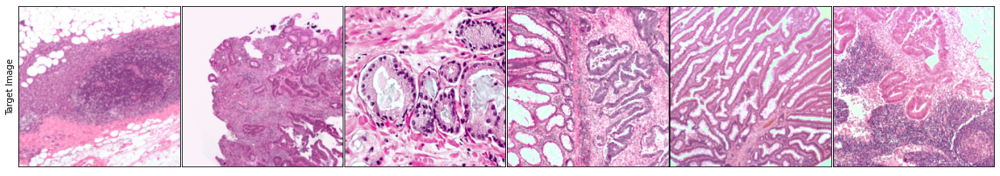

In [19]:
_plot_imagegrid(all_transformed[1], (1,len(row_transformed)),figsize=(20,20), ylabels=["Target Image"] + [None]*5)

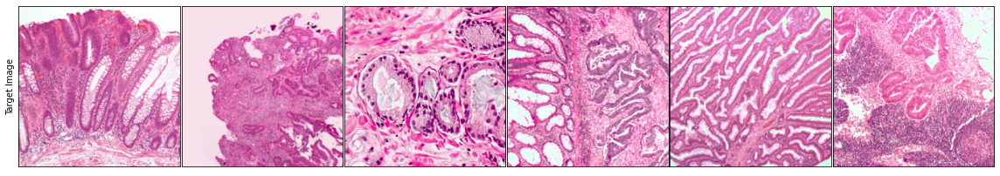

In [23]:
_plot_imagegrid(all_transformed[2], (1,len(row_transformed)),figsize=(20,20), ylabels=["Target Image"] + [None]*5)

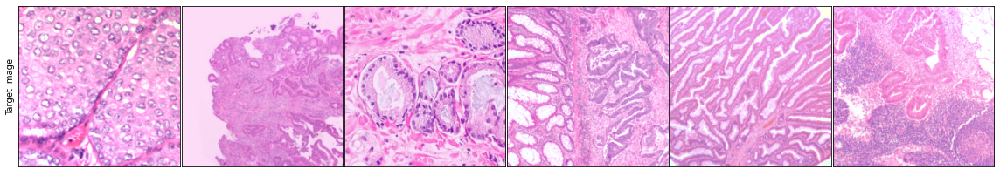

In [21]:
_plot_imagegrid(all_transformed[3], (1,len(row_transformed)),figsize=(20,20), ylabels=["Target Image"] + [None]*5)

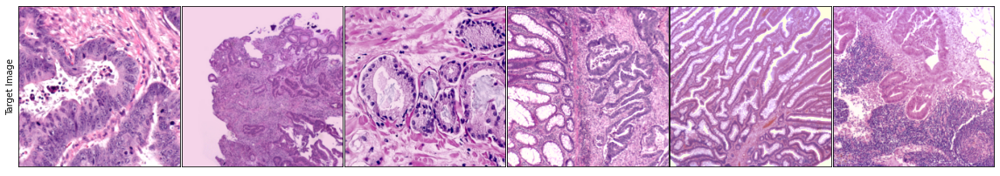

In [22]:
_plot_imagegrid(all_transformed[4], (1,len(row_transformed)),figsize=(20,20), ylabels=["Target Image"] + [None]*5)

In [23]:
## Write a table of performance in the paper comparing total computing times!